# Wikipedia Edits

### Introduction
A stakeholder has found a dataset that they think could be leveraged to create exciting new features inside a product. He has loaded the data into a dataframe and graph structure and created some simple visualisations as well as a possible method for predicting missing links.

Your job is to have a meeting with the stakeholder, work out what the data contains, determine a possible long term strategy and advise on the feasibility of his missing link prediciton approach. 


### Instructions
 1. Ask any questions you like about the data and the types of features we want to implement
 2. Discuss what approaches you would like to research given a long time horizon
 3. Evaluate preferential attachment for predicting missing links in this problem
 4. Visualise the page features to help inform if they will be useful


The data is from [Wikipeda recent changes API](https://stream.wikimedia.org/v2/stream/recentchange) (can be streamed in Chrome).

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

In [2]:
df = pd.read_csv("data/wikipedia/train.csv", parse_dates=["timestamp"])
df.head()

,page,page_uri,timestamp,user_id,page_id,page_features
0,Temple Texas,"https://en.wikipedia.org/wiki/Temple,_Texas",2021-07-30 15:11:13,6292,16332,"[0.8703170418739319, -0.27755680680274963, 2.1..."
1,COVID-19 vaccination in mainland China,https://en.wikipedia.org/wiki/COVID-19_vaccina...,2021-07-30 15:11:13,5347,3275,"[1.0088313817977905, -1.3502126932144165, 0.20..."
2,Peter Bosa,https://en.wikipedia.org/wiki/Peter_Bosa,2021-07-30 15:11:14,5394,13162,"[-1.0888231992721558, 0.6187885999679565, -0.0..."
3,Zinc Football Academy,https://en.wikipedia.org/wiki/Zinc_Football_Ac...,2021-07-30 15:11:15,4617,18538,"[1.4441801309585571, 1.002966284751892, -0.886..."
4,Toe punt,https://en.wikipedia.org/wiki/Toe_punt,2021-07-30 15:11:16,5195,17037,"[1.0439115762710571, 0.5207668542861938, -0.96..."


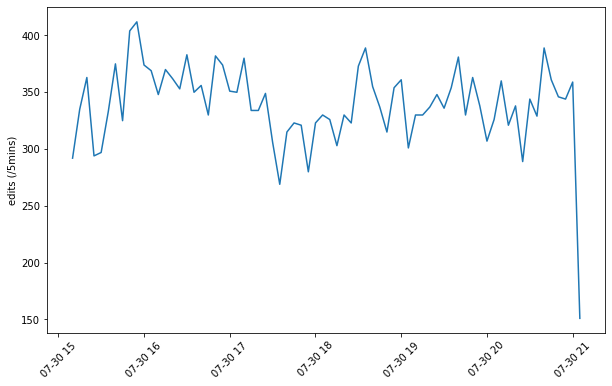

In [3]:
resampled = df.set_index("timestamp").resample("5T").count()

plt.figure(figsize=(10, 6))
plt.plot(resampled.index, resampled.page)
plt.ylabel("edits (/5mins)")
_ = plt.xticks(rotation = 45)

In [4]:
G = nx.Graph()
for idx, row in df.iterrows():
    G.add_node(row.user_id)
    G.add_node(row.page)
    G.add_edge(row.user_id, row.page)

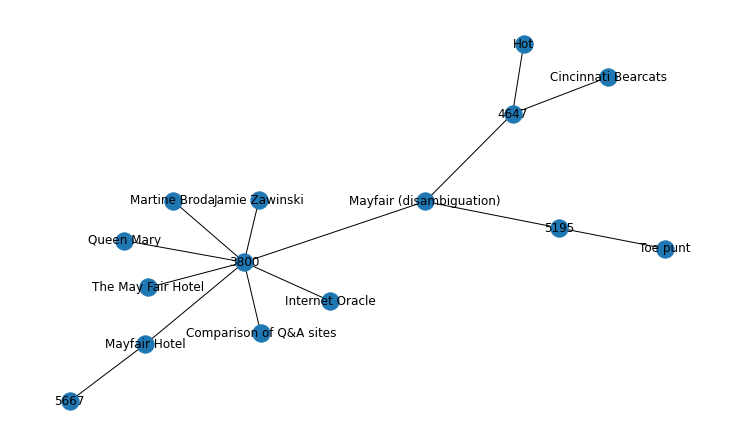

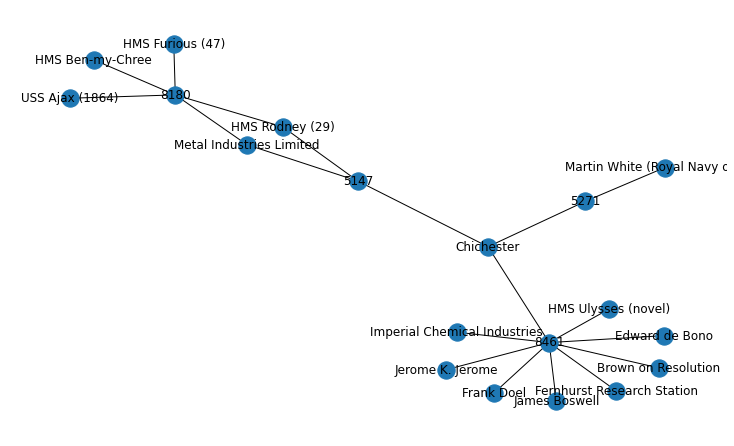

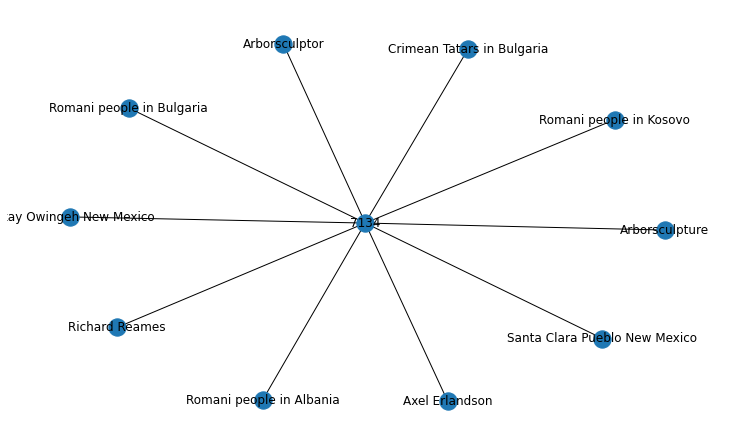

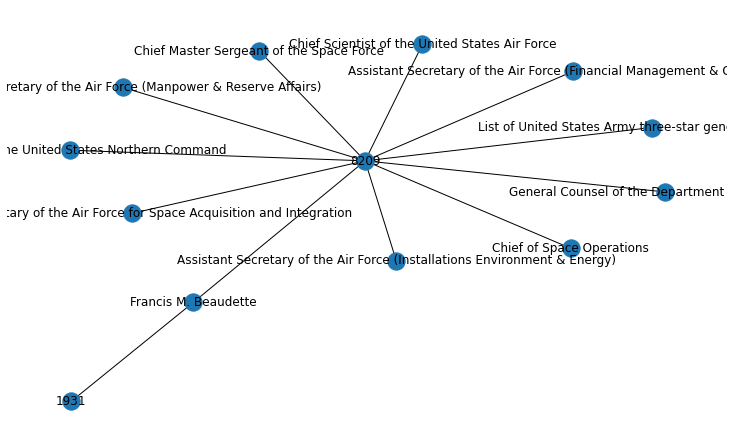

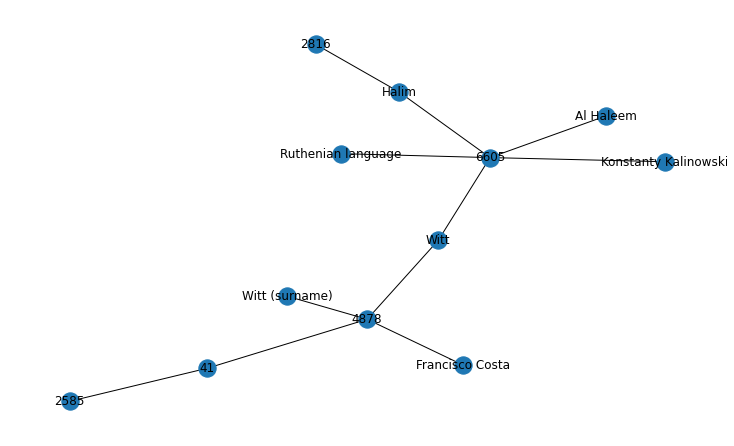

...

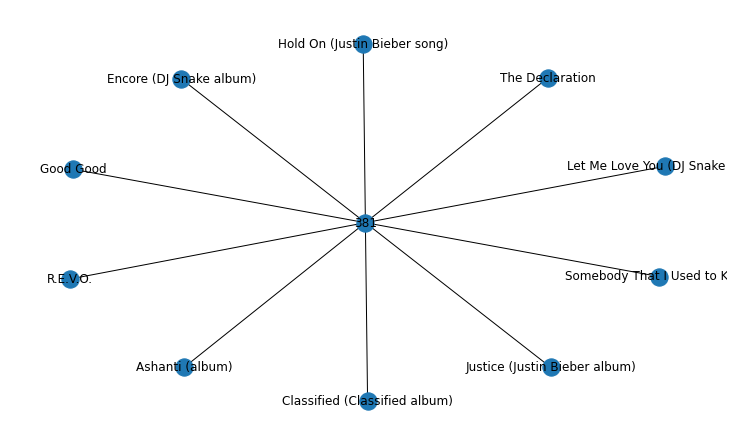

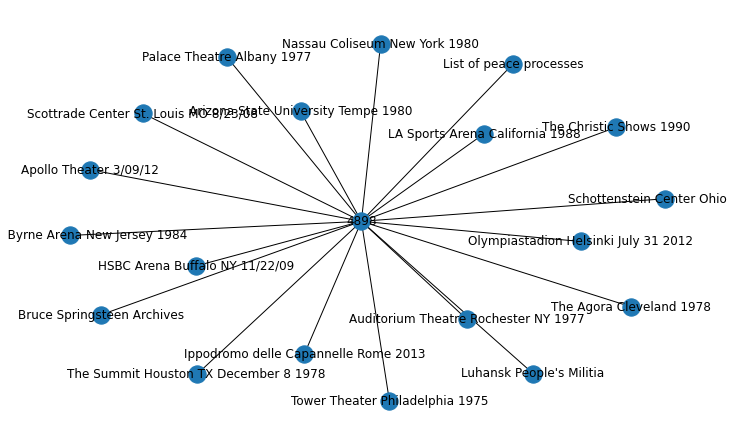

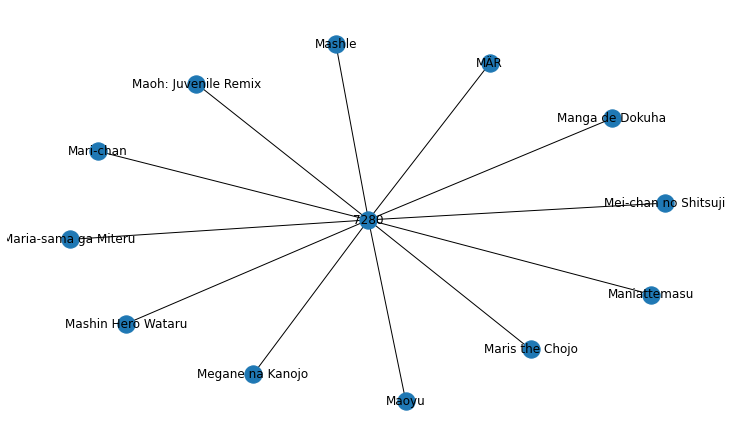

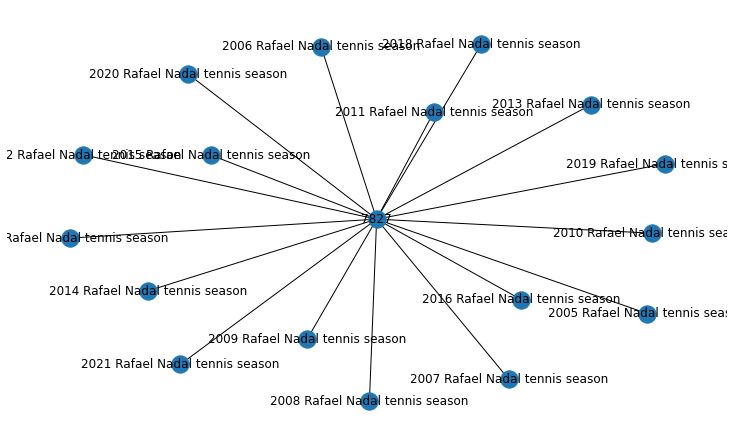

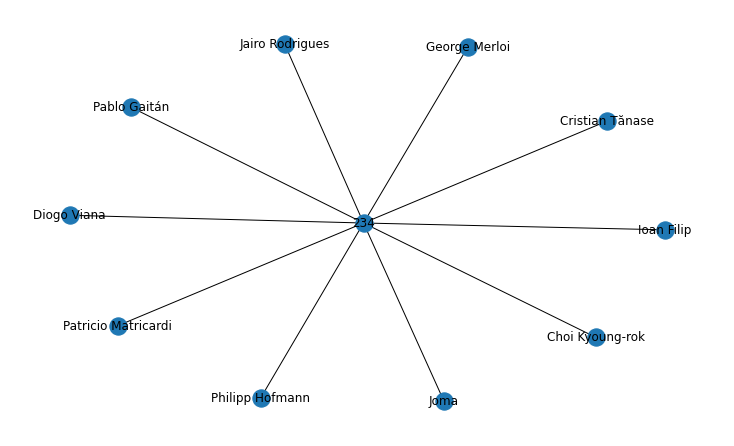

In [5]:
for connected_nodes in nx.connected_components(G):
    # Skip very small or large components
    if 10 > len(connected_nodes) or len(connected_nodes) > 30:
        continue
    sub_graph = G.subgraph(connected_nodes)
    plt.figure(figsize=(10, 6))
    nx.draw(sub_graph, with_labels=True)
    plt.show()

In [6]:
# http://www.cs.cornell.edu/home/kleinber/link-pred.pdf
# https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.link_prediction.preferential_attachment.html

preds = nx.preferential_attachment(G, [(8180, "Chichester"), (8180, "Martin White (Royal Navy officer)")])
for src_node, end_node, score in preds:
    print(f"{src_node} -> {end_node}: {score}")

8180 -> Chichester: 15
8180 -> Martin White (Royal Navy officer): 5
